In [2]:
# pip install mlflow boto3 awscli optuna imbalanced-learn lightgbm
! pip install plotly

In [3]:
import mlflow
# step 1 : Set up the mlflow tracking server 
mlflow.set_tracking_uri("http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/")

In [4]:
mlflow.set_experiment("LightGBM(best_model) HP Tuning")

<Experiment: artifact_location='s3://reddit-reccomender-bucket/13', creation_time=1763460555329, experiment_id='13', last_update_time=1763460555329, lifecycle_stage='active', name='LightGBM(best_model) HP Tuning', tags={'mlflow.experimentKind': 'custom_model_development'}>

In [5]:
import optuna
import mlflow
import mlflow.sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,f1_score
from sklearn.feature_extraction.text import CountVectorizer
from lightgbm import LGBMClassifier
from imblearn.under_sampling import RandomUnderSampler
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from optuna.visualization import matplotlib as vis

In [6]:
df = pd.read_csv('reddit_preprocessing.csv').dropna(subset=['clean_comment'])
df.shape

(36662, 2)

In [7]:
# Step 1: Remap the class labels from [-1, 0, 1] to [2, 0, 1]
df['category'] = df['category'].map({-1: 2, 0: 0, 1: 1})

# Step 2: Remove rows where the target labels (category) are NaN
df = df.dropna(subset=['category'])

#step 3: BOW setup with train test split
ngram_range = (1,3) 
max_features = 1000 

X_train,X_test,y_train,y_test = train_test_split(df['clean_comment'],df['category'],test_size=0.2,random_state=42,stratify=df['category'])

vectorizer = CountVectorizer(ngram_range=ngram_range,max_features=max_features)
X_train_vec= vectorizer.fit_transform(X_train).astype(np.float32)
X_test_vec = vectorizer.transform(X_test).astype(np.float32)

# use undersampler to handle Imbalanced data
rus = RandomUnderSampler(random_state=42)
X_train_vec,y_train = rus.fit_resample(X_train_vec,y_train)
X_train_vec = X_train_vec.astype(np.float32)

#Function to log results in MLflow
def log_mlflow_trial(model_name,params,metrics,trial_number):
    # FIXED: Separate MLflow run per trial (avoid retraining full data)
        # Log model type and trial number
    with mlflow.start_run(run_name=f"Trial_{trial_number}_{model_name}_BOW"):
        mlflow.set_tag("experiment_type", "algorithm_comparison")
        mlflow.log_params(params)
        mlflow.log_metric("val_accuracy", metrics)

def log_mlflow_best(model_name, model, X_train, X_test, y_train, y_test, params):
    # FIXED: Log best model trained on full data separately
     with mlflow.start_run(run_name=f"Best_{model_name}_BOW"):
        mlflow.set_tag("experiment_type", "algorithm_comparison")
        mlflow.log_params(params)
        y_pred = model.predict(X_test)
        test_acc = accuracy_score(y_test, y_pred)
        mlflow.log_metric("test_accuracy", test_acc)    

        # Log classification report
        classification_rep = classification_report(y_test, y_pred, output_dict=True)
        for label, metrics in classification_rep.items():
            if isinstance(metrics, dict):
                for metric, value in metrics.items():
                    mlflow.log_metric(f"{label}_{metric}", value)

        # Log the model
        mlflow.sklearn.log_model(model, f"{model_name}_model")

    

[I 2025-11-18 18:27:27,500] A new study created in memory with name: no-name-03ad300f-8b88-491d-83fe-ade75dc9b5c0


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007058 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2353
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 482
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_0_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/c7a7252702794aafbaae2a504026fd78
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:27:34,520] Trial 0 finished with value: 0.7092700176812327 and parameters: {'n_estimators': 303, 'learning_rate': 0.040640340889188706, 'max_depth': 4, 'num_leaves': 36, 'min_child_samples': 94, 'colsample_bytree': 0.5079639735422912, 'subsample': 0.570457871288654, 'reg_alpha': 0.006977030650043568, 'reg_lambda': 0.005087343008305132}. Best is trial 0 with value: 0.7092700176812327.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2856
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 606
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_1_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/7ef2c0eba79c4bf48ece39363706a895
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:27:41,992] Trial 1 finished with value: 0.6405657994443041 and parameters: {'n_estimators': 806, 'learning_rate': 0.00025203996248652, 'max_depth': 9, 'num_leaves': 122, 'min_child_samples': 77, 'colsample_bytree': 0.5880614542304017, 'subsample': 0.6653438120703508, 'reg_alpha': 0.001126391660784268, 'reg_lambda': 0.09228775212846646}. Best is trial 0 with value: 0.7092700176812327.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2394
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 492
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_2_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/0541b42ce52c48b781a4605e6a861aed
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:27:45,080] Trial 2 finished with value: 0.5953523617075019 and parameters: {'n_estimators': 177, 'learning_rate': 0.0003611123132806914, 'max_depth': 5, 'num_leaves': 69, 'min_child_samples': 92, 'colsample_bytree': 0.6157166847270233, 'subsample': 0.7038386453480958, 'reg_alpha': 0.2826976053034763, 'reg_lambda': 0.04560725815781788}. Best is trial 0 with value: 0.7092700176812327.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2866
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 609
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_3_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/bf3802c8dc894ddea66313708e8c39ad
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:27:50,513] Trial 3 finished with value: 0.7208891134124779 and parameters: {'n_estimators': 644, 'learning_rate': 0.005085137268452433, 'max_depth': 14, 'num_leaves': 136, 'min_child_samples': 76, 'colsample_bytree': 0.9447096412276039, 'subsample': 0.6628174795288169, 'reg_alpha': 0.01889321261793584, 'reg_lambda': 0.016050735455590912}. Best is trial 3 with value: 0.7208891134124779.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2837
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 601
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_4_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/a8f06eddfd374d50af38876e03fbc6f8
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:27:53,560] Trial 4 finished with value: 0.6312200050517808 and parameters: {'n_estimators': 143, 'learning_rate': 0.0011621110622391272, 'max_depth': 11, 'num_leaves': 148, 'min_child_samples': 78, 'colsample_bytree': 0.9588095604856138, 'subsample': 0.9510823712120126, 'reg_alpha': 0.07162740984941604, 'reg_lambda': 1.1272208511364763}. Best is trial 3 with value: 0.7208891134124779.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3575
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 796
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_5_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/a16a32033a4d48b08a6e252c496d6f08
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:27:56,640] Trial 5 finished with value: 0.6196009093205355 and parameters: {'n_estimators': 243, 'learning_rate': 0.00011076864956671168, 'max_depth': 7, 'num_leaves': 126, 'min_child_samples': 60, 'colsample_bytree': 0.6570669596235895, 'subsample': 0.6871709952190816, 'reg_alpha': 6.517365670796931, 'reg_lambda': 0.001386686198313544}. Best is trial 3 with value: 0.7208891134124779.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012975 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3575
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 796
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_6_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/7f5a5b177727460091525c26cdd36e20
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:28:01,137] Trial 6 finished with value: 0.7534730992674918 and parameters: {'n_estimators': 730, 'learning_rate': 0.03276887463890559, 'max_depth': 7, 'num_leaves': 77, 'min_child_samples': 60, 'colsample_bytree': 0.7756459626469562, 'subsample': 0.6303705356589631, 'reg_alpha': 0.000787916538954208, 'reg_lambda': 0.016835271574866785}. Best is trial 6 with value: 0.7534730992674918.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3049
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 656
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_7_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/a324f873a71d422385311f49fa28801f
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:28:04,814] Trial 7 finished with value: 0.7448850719878757 and parameters: {'n_estimators': 431, 'learning_rate': 0.0705946908949692, 'max_depth': 7, 'num_leaves': 54, 'min_child_samples': 71, 'colsample_bytree': 0.6112734648190399, 'subsample': 0.6363949292473878, 'reg_alpha': 1.3420858784738074, 'reg_lambda': 1.7007013607973418}. Best is trial 6 with value: 0.7534730992674918.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022763 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_8_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/e44ea55b014b4e0cbbd69ffc0b98c910
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:28:08,705] Trial 8 finished with value: 0.540035362465269 and parameters: {'n_estimators': 649, 'learning_rate': 0.00023911674713326204, 'max_depth': 3, 'num_leaves': 101, 'min_child_samples': 14, 'colsample_bytree': 0.8749948983110429, 'subsample': 0.9984769365060924, 'reg_alpha': 0.014801831120877037, 'reg_lambda': 0.042221070747272646}. Best is trial 6 with value: 0.7534730992674918.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3530
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 785
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_9_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/ece0a649abec4b9c9007ad88fc57c60a
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:28:15,073] Trial 9 finished with value: 0.6766860318262188 and parameters: {'n_estimators': 774, 'learning_rate': 0.00012111296426495005, 'max_depth': 13, 'num_leaves': 66, 'min_child_samples': 61, 'colsample_bytree': 0.622245833164608, 'subsample': 0.9580800148272345, 'reg_alpha': 0.012990716695648198, 'reg_lambda': 0.000316365320638671}. Best is trial 6 with value: 0.7534730992674918.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4208
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 960
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_10_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/7a9a1843de464b189402508bce88e94e
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:28:21,049] Trial 10 finished with value: 0.7653447840363728 and parameters: {'n_estimators': 985, 'learning_rate': 0.013797250834116665, 'max_depth': 9, 'num_leaves': 20, 'min_child_samples': 35, 'colsample_bytree': 0.7829664865193975, 'subsample': 0.8063589085386317, 'reg_alpha': 0.00014659947055456552, 'reg_lambda': 0.00013325930126804701}. Best is trial 10 with value: 0.7653447840363728.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4208
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 960
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_11_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/08093da5ef3b4c3e89c191a348006052
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:28:27,067] Trial 11 finished with value: 0.7648396059611013 and parameters: {'n_estimators': 978, 'learning_rate': 0.012085087519385888, 'max_depth': 9, 'num_leaves': 23, 'min_child_samples': 35, 'colsample_bytree': 0.785869304583288, 'subsample': 0.8323324512842852, 'reg_alpha': 0.00011428960800112338, 'reg_lambda': 0.00016102549511875085}. Best is trial 10 with value: 0.7653447840363728.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016669 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4208
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 960
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_12_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/c4e4568fd134469c9d4a8eb73638de0f
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:28:33,553] Trial 12 finished with value: 0.7625663046223794 and parameters: {'n_estimators': 1000, 'learning_rate': 0.009478587368916212, 'max_depth': 10, 'num_leaves': 23, 'min_child_samples': 31, 'colsample_bytree': 0.7816935212427013, 'subsample': 0.8445611836847653, 'reg_alpha': 0.00013406572044554377, 'reg_lambda': 0.00010133840262105241}. Best is trial 10 with value: 0.7653447840363728.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016970 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4208
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 960
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_13_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/976ae8620a88429e9cfbbdc8cb20d460
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:28:40,508] Trial 13 finished with value: 0.7678706744127305 and parameters: {'n_estimators': 975, 'learning_rate': 0.01230105290559875, 'max_depth': 12, 'num_leaves': 40, 'min_child_samples': 35, 'colsample_bytree': 0.8468619765232142, 'subsample': 0.8193407861819614, 'reg_alpha': 0.00011358848896890357, 'reg_lambda': 0.000928877992638597}. Best is trial 13 with value: 0.7678706744127305.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4166
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 951
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_14_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/7a607647c1384bf68ab678e5584818ff
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:28:48,219] Trial 14 finished with value: 0.6867895933316495 and parameters: {'n_estimators': 888, 'learning_rate': 0.0019556431742339315, 'max_depth': 12, 'num_leaves': 41, 'min_child_samples': 40, 'colsample_bytree': 0.8664991334915415, 'subsample': 0.7934449647754862, 'reg_alpha': 0.001282702591969876, 'reg_lambda': 0.0010279998991129331}. Best is trial 13 with value: 0.7678706744127305.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011935 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_15_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/2b8451909f274ce0b54d2c86ad97164d
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:28:54,305] Trial 15 finished with value: 0.7779742359181612 and parameters: {'n_estimators': 512, 'learning_rate': 0.019294747091230954, 'max_depth': 15, 'num_leaves': 49, 'min_child_samples': 16, 'colsample_bytree': 0.7197746651186496, 'subsample': 0.8916755009510675, 'reg_alpha': 0.0003476230117338507, 'reg_lambda': 0.0009059024005319413}. Best is trial 15 with value: 0.7779742359181612.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011575 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4258
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 970
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_16_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/34a3d5e1d9dd40e6850c3acb975f5b0f
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:29:03,118] Trial 16 finished with value: 0.7117959080575903 and parameters: {'n_estimators': 474, 'learning_rate': 0.004322763216825655, 'max_depth': 14, 'num_leaves': 94, 'min_child_samples': 11, 'colsample_bytree': 0.7107029752153797, 'subsample': 0.8979272684036077, 'reg_alpha': 0.0005253949279988536, 'reg_lambda': 0.0017641384450837743}. Best is trial 15 with value: 0.7779742359181612.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012027 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_17_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/61913e9983664814aa54f1484790680a
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:29:07,806] Trial 17 finished with value: 0.7638292498105582 and parameters: {'n_estimators': 380, 'learning_rate': 0.02844811769796819, 'max_depth': 15, 'num_leaves': 54, 'min_child_samples': 20, 'colsample_bytree': 0.8499723095470634, 'subsample': 0.8828028755608772, 'reg_alpha': 0.0033028947451749207, 'reg_lambda': 7.600068832872037}. Best is trial 15 with value: 0.7779742359181612.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4046
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 921
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_18_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/53d16cc2dcfd4803a18b7ad55c4e4732
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:29:12,970] Trial 18 finished with value: 0.7600404142460218 and parameters: {'n_estimators': 579, 'learning_rate': 0.08260062627221765, 'max_depth': 15, 'num_leaves': 46, 'min_child_samples': 47, 'colsample_bytree': 0.70677516109772, 'subsample': 0.754393160401206, 'reg_alpha': 0.00034982036963374525, 'reg_lambda': 0.003903573197256711}. Best is trial 15 with value: 0.7779742359181612.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4242
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 966
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_19_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/eb7e69f1fb214e62b06ec3d7bed8cbf7
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:29:19,092] Trial 19 finished with value: 0.6547107855519071 and parameters: {'n_estimators': 526, 'learning_rate': 0.0018858728886263004, 'max_depth': 12, 'num_leaves': 88, 'min_child_samples': 24, 'colsample_bytree': 0.9161846310201579, 'subsample': 0.5110328068987366, 'reg_alpha': 0.0878365865134972, 'reg_lambda': 0.0005904740086226455}. Best is trial 15 with value: 0.7779742359181612.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011435 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4031
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 917
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_20_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/6525729b270f45cdbf7ab3a6cc710450
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:29:23,251] Trial 20 finished with value: 0.7527153321545845 and parameters: {'n_estimators': 349, 'learning_rate': 0.01813384810022348, 'max_depth': 13, 'num_leaves': 61, 'min_child_samples': 48, 'colsample_bytree': 0.8259676885940511, 'subsample': 0.7554220551824097, 'reg_alpha': 0.0026671575011888637, 'reg_lambda': 0.1923181437326444}. Best is trial 15 with value: 0.7779742359181612.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012359 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4214
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 961
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_21_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/38c7fbbc87cb43939f79781dd408a141
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:29:29,794] Trial 21 finished with value: 0.7506946198534984 and parameters: {'n_estimators': 869, 'learning_rate': 0.007956633361736102, 'max_depth': 10, 'num_leaves': 33, 'min_child_samples': 27, 'colsample_bytree': 0.7187412339947201, 'subsample': 0.8221463685706389, 'reg_alpha': 0.0002339548386918815, 'reg_lambda': 0.00032715536924155436}. Best is trial 15 with value: 0.7779742359181612.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4166
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 951
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_22_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/519b866a8968450b9f41623fc6416573
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:29:35,233] Trial 22 finished with value: 0.7633240717352867 and parameters: {'n_estimators': 908, 'learning_rate': 0.018136370783870467, 'max_depth': 8, 'num_leaves': 21, 'min_child_samples': 40, 'colsample_bytree': 0.820877625273046, 'subsample': 0.8848056829434334, 'reg_alpha': 0.0003489161787043269, 'reg_lambda': 0.004368148604830123}. Best is trial 15 with value: 0.7779742359181612.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_23_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/341acf759955466bbcf94780ba286cb9
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:29:40,947] Trial 23 finished with value: 0.7746905784288962 and parameters: {'n_estimators': 689, 'learning_rate': 0.019598310678639444, 'max_depth': 11, 'num_leaves': 32, 'min_child_samples': 19, 'colsample_bytree': 0.732616304324538, 'subsample': 0.7938703805964669, 'reg_alpha': 0.0001035965297840362, 'reg_lambda': 0.00026565298668872694}. Best is trial 15 with value: 0.7779742359181612.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013637 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_24_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/fc1a3a1720904e33888375153548ddfb
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:29:46,888] Trial 24 finished with value: 0.7757009345794392 and parameters: {'n_estimators': 684, 'learning_rate': 0.045139963488280324, 'max_depth': 11, 'num_leaves': 47, 'min_child_samples': 19, 'colsample_bytree': 0.6636742009885922, 'subsample': 0.9261850168703613, 'reg_alpha': 0.002537984989353374, 'reg_lambda': 0.0005875766504876264}. Best is trial 15 with value: 0.7779742359181612.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_25_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/3c9c269066d142e0b328f7774b87c098
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:29:52,952] Trial 25 finished with value: 0.7749431674665319 and parameters: {'n_estimators': 682, 'learning_rate': 0.05186042686636081, 'max_depth': 11, 'num_leaves': 53, 'min_child_samples': 18, 'colsample_bytree': 0.6757797344165604, 'subsample': 0.9229032766935312, 'reg_alpha': 0.002923870395463016, 'reg_lambda': 0.00038473630686017025}. Best is trial 15 with value: 0.7779742359181612.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_26_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/17dc57309c2249b8893ee86daec99072
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:29:58,590] Trial 26 finished with value: 0.7797423591816115 and parameters: {'n_estimators': 568, 'learning_rate': 0.05341390561646834, 'max_depth': 11, 'num_leaves': 79, 'min_child_samples': 15, 'colsample_bytree': 0.668533849457427, 'subsample': 0.9316635644849961, 'reg_alpha': 0.003357453807636185, 'reg_lambda': 0.0023995963500738605}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4258
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 970
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_27_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/4a823564c9534024bb01c6358d49e87d
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:30:06,462] Trial 27 finished with value: 0.7643344278858297 and parameters: {'n_estimators': 571, 'learning_rate': 0.08556973729742752, 'max_depth': 13, 'num_leaves': 108, 'min_child_samples': 11, 'colsample_bytree': 0.576718464328273, 'subsample': 0.9946430800680168, 'reg_alpha': 0.006635878168257689, 'reg_lambda': 0.002609197066636804}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012801 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4214
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 961
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_28_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/e57fcaaa0de549d4bcb4c78a327df2ba
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:30:11,539] Trial 28 finished with value: 0.7719120990149028 and parameters: {'n_estimators': 494, 'learning_rate': 0.05396547223081262, 'max_depth': 14, 'num_leaves': 79, 'min_child_samples': 26, 'colsample_bytree': 0.6673984862086862, 'subsample': 0.9412192359262149, 'reg_alpha': 0.0015752825855960217, 'reg_lambda': 0.008851296105315196}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4265
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 972
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_29_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/5303f055a2854d4583f15de1362689bf
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:30:17,527] Trial 29 finished with value: 0.7595352361707501 and parameters: {'n_estimators': 604, 'learning_rate': 0.03142081696768469, 'max_depth': 5, 'num_leaves': 74, 'min_child_samples': 10, 'colsample_bytree': 0.5094742508556083, 'subsample': 0.869622061743822, 'reg_alpha': 0.006284891518958359, 'reg_lambda': 0.005328813097798254}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4251
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 968
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_30_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/d7019c615edb4dea9bc4e00d2306e9e9
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:30:23,091] Trial 30 finished with value: 0.7741854003536246 and parameters: {'n_estimators': 423, 'learning_rate': 0.04594433837184895, 'max_depth': 10, 'num_leaves': 62, 'min_child_samples': 21, 'colsample_bytree': 0.5343157296097389, 'subsample': 0.9176045265263687, 'reg_alpha': 0.03166810060688637, 'reg_lambda': 0.0008074126889514386}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018800 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_31_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/82908c659214413d9eb6261edec17615
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:30:28,966] Trial 31 finished with value: 0.7749431674665319 and parameters: {'n_estimators': 721, 'learning_rate': 0.050916742426877624, 'max_depth': 11, 'num_leaves': 51, 'min_child_samples': 18, 'colsample_bytree': 0.6624535554367248, 'subsample': 0.9320513641786932, 'reg_alpha': 0.0030886729663930283, 'reg_lambda': 0.0004412385256635038}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025457 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_32_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/98d08784e1244e129594bee207385a14
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:30:35,733] Trial 32 finished with value: 0.776963879767618 and parameters: {'n_estimators': 799, 'learning_rate': 0.029009102059486414, 'max_depth': 11, 'num_leaves': 58, 'min_child_samples': 15, 'colsample_bytree': 0.6832658303904584, 'subsample': 0.9624110145225057, 'reg_alpha': 0.0007125229469103497, 'reg_lambda': 0.001952314015531316}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4214
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 961
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_33_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/aee8ba9f3a9b42b09d92334ef2116666
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:30:41,162] Trial 33 finished with value: 0.7721646880525386 and parameters: {'n_estimators': 813, 'learning_rate': 0.02527425989989394, 'max_depth': 8, 'num_leaves': 85, 'min_child_samples': 28, 'colsample_bytree': 0.6370306073442578, 'subsample': 0.9718060908376457, 'reg_alpha': 0.0006420527326259797, 'reg_lambda': 0.0026171444332843295}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_34_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/91b619ae0b6d401d8fb985dcf2e84cb4
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:30:51,235] Trial 34 finished with value: 0.7613033594342006 and parameters: {'n_estimators': 821, 'learning_rate': 0.09060750579732181, 'max_depth': 12, 'num_leaves': 71, 'min_child_samples': 17, 'colsample_bytree': 0.5632464915007135, 'subsample': 0.8547260880547077, 'reg_alpha': 0.0016899322973141775, 'reg_lambda': 0.011915888533067244}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008811 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2259
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 459
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_35_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/fb6edac8e8b74270a77c299dacf38cbe
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:30:55,810] Trial 35 finished with value: 0.7011871684768881 and parameters: {'n_estimators': 619, 'learning_rate': 0.007010319531002758, 'max_depth': 10, 'num_leaves': 61, 'min_child_samples': 98, 'colsample_bytree': 0.6931512031396744, 'subsample': 0.9706667295879307, 'reg_alpha': 0.0008268867418070405, 'reg_lambda': 0.0021094642599181006}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_36_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/fe7b3d701db34876a82b2008ad3500ab
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:31:01,734] Trial 36 finished with value: 0.7779742359181612 and parameters: {'n_estimators': 535, 'learning_rate': 0.037875257821125684, 'max_depth': 13, 'num_leaves': 45, 'min_child_samples': 14, 'colsample_bytree': 0.6414870560367322, 'subsample': 0.9070888191737716, 'reg_alpha': 0.00033544069534665027, 'reg_lambda': 0.19893162741541726}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_37_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/c2c79daa264c4f8985e8c15ed242138f
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:31:10,087] Trial 37 finished with value: 0.6799696893154837 and parameters: {'n_estimators': 530, 'learning_rate': 0.0007012133410373052, 'max_depth': 15, 'num_leaves': 114, 'min_child_samples': 14, 'colsample_bytree': 0.7546186544240503, 'subsample': 0.9085869480859022, 'reg_alpha': 0.000279846404125601, 'reg_lambda': 0.26764752328282226}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014744 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4242
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 966
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_38_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/f446222d91fc4836bfe3e0b81bd956c7
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:31:15,329] Trial 38 finished with value: 0.7600404142460218 and parameters: {'n_estimators': 298, 'learning_rate': 0.02307728742553211, 'max_depth': 14, 'num_leaves': 80, 'min_child_samples': 24, 'colsample_bytree': 0.7464168910023292, 'subsample': 0.7262366404391348, 'reg_alpha': 0.000548127740281838, 'reg_lambda': 0.09920992098487558}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011612 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4208
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 960
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_39_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/5cd831f12c134a038cca83c4ef4371b9
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:31:20,520] Trial 39 finished with value: 0.6981561000252589 and parameters: {'n_estimators': 248, 'learning_rate': 0.004900909331453414, 'max_depth': 13, 'num_leaves': 67, 'min_child_samples': 30, 'colsample_bytree': 0.5870695331426545, 'subsample': 0.9749756128179029, 'reg_alpha': 0.00023988304792746317, 'reg_lambda': 0.025938390784241386}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2525
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 523
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_40_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/d4d37b02a3084033858979e15b10289b
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:31:25,188] Trial 40 finished with value: 0.7322556201060874 and parameters: {'n_estimators': 451, 'learning_rate': 0.036368163266467524, 'max_depth': 14, 'num_leaves': 94, 'min_child_samples': 88, 'colsample_bytree': 0.6039499234988852, 'subsample': 0.8623730431604563, 'reg_alpha': 0.3954114351163474, 'reg_lambda': 1.627348467805686}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015318 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_41_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/0c6d58ccc1174284b74afa55e88d2f37
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:31:31,718] Trial 41 finished with value: 0.7711543319019954 and parameters: {'n_estimators': 755, 'learning_rate': 0.06264405240869886, 'max_depth': 11, 'num_leaves': 46, 'min_child_samples': 14, 'colsample_bytree': 0.6458036358946427, 'subsample': 0.9001724438268646, 'reg_alpha': 0.001026182703433093, 'reg_lambda': 0.5520688315666971}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013973 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_42_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/151615dc4d5449ebb5abb7797d3ca66e
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:31:37,303] Trial 42 finished with value: 0.77923718110634 and parameters: {'n_estimators': 645, 'learning_rate': 0.03555327661198884, 'max_depth': 12, 'num_leaves': 30, 'min_child_samples': 15, 'colsample_bytree': 0.6966324900292382, 'subsample': 0.94460830144843, 'reg_alpha': 0.005260022315076218, 'reg_lambda': 0.006387263322685513}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012569 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4242
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 966
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_43_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/2f0a62cf759044f5882ac5285a26ae29
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:31:42,494] Trial 43 finished with value: 0.7726698661278101 and parameters: {'n_estimators': 519, 'learning_rate': 0.035490591885121076, 'max_depth': 13, 'num_leaves': 29, 'min_child_samples': 23, 'colsample_bytree': 0.683269251399921, 'subsample': 0.9430043206072184, 'reg_alpha': 0.009161534781113647, 'reg_lambda': 0.0075650409527059205}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_44_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/31a4d3e59e964e9285a128402f06afe3
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:31:49,217] Trial 44 finished with value: 0.7691336196009093 and parameters: {'n_estimators': 632, 'learning_rate': 0.01476009544318624, 'max_depth': 12, 'num_leaves': 38, 'min_child_samples': 13, 'colsample_bytree': 0.6306555652746215, 'subsample': 0.9955058829983767, 'reg_alpha': 0.005537949751847515, 'reg_lambda': 0.02443315466942899}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3145
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 682
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_45_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/4a005d65af8c447eb44831bd63fd4423
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:31:55,126] Trial 45 finished with value: 0.7464006062136903 and parameters: {'n_estimators': 572, 'learning_rate': 0.023630062738051846, 'max_depth': 15, 'num_leaves': 58, 'min_child_samples': 68, 'colsample_bytree': 0.9904638240731527, 'subsample': 0.9530727906090722, 'reg_alpha': 0.023714761076381975, 'reg_lambda': 0.06329270070348787}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_46_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/057bbbe9517040d8bfc70ca700e37be1
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:32:01,177] Trial 46 finished with value: 0.7757009345794392 and parameters: {'n_estimators': 431, 'learning_rate': 0.06710653306894056, 'max_depth': 13, 'num_leaves': 147, 'min_child_samples': 15, 'colsample_bytree': 0.7551425969861629, 'subsample': 0.9671052004634586, 'reg_alpha': 0.054079355753074605, 'reg_lambda': 0.0014337995993132823}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4208
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 960
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_47_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/4c713b6914b1475b9060c6ab2bd6b6e6
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:32:08,453] Trial 47 finished with value: 0.7549886334933064 and parameters: {'n_estimators': 650, 'learning_rate': 0.009624185197601375, 'max_depth': 12, 'num_leaves': 43, 'min_child_samples': 33, 'colsample_bytree': 0.6041700045626818, 'subsample': 0.8819625959180674, 'reg_alpha': 0.00047579223188813657, 'reg_lambda': 0.016233613609732644}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4179
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 954
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_48_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/a6c332cc5015497eb068cb8db81dd0d5
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:32:14,585] Trial 48 finished with value: 0.7703965647890881 and parameters: {'n_estimators': 777, 'learning_rate': 0.03616612444626813, 'max_depth': 14, 'num_leaves': 31, 'min_child_samples': 38, 'colsample_bytree': 0.697286047276635, 'subsample': 0.5859505916956875, 'reg_alpha': 0.0017737619543374994, 'reg_lambda': 0.0033675751367833904}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4265
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 972
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_49_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/7c0e3f71dca94edfa592285d1d33e881
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:32:19,229] Trial 49 finished with value: 0.7529679211922202 and parameters: {'n_estimators': 543, 'learning_rate': 0.06691224097561074, 'max_depth': 10, 'num_leaves': 26, 'min_child_samples': 10, 'colsample_bytree': 0.7292994592806296, 'subsample': 0.9032181434267007, 'reg_alpha': 8.11759129644072, 'reg_lambda': 0.005988993759667578}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016994 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4046
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 921
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_50_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/6ca619f887b941df8e7ae7a5b7a31c8d
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:32:23,564] Trial 50 finished with value: 0.7474109623642334 and parameters: {'n_estimators': 474, 'learning_rate': 0.01610222428740563, 'max_depth': 9, 'num_leaves': 36, 'min_child_samples': 47, 'colsample_bytree': 0.6499665617682525, 'subsample': 0.9497652033898665, 'reg_alpha': 0.0002065919974086458, 'reg_lambda': 0.00018943139441129488}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011976 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4247
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 967
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_51_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/41de8eddda7e45b5a3afd80c2aa3dc45
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:32:29,594] Trial 51 finished with value: 0.7754483455418035 and parameters: {'n_estimators': 678, 'learning_rate': 0.04717786808541902, 'max_depth': 11, 'num_leaves': 47, 'min_child_samples': 22, 'colsample_bytree': 0.6850740402869677, 'subsample': 0.9202486809361782, 'reg_alpha': 0.0010593576310999107, 'reg_lambda': 0.0011691170151351066}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015922 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_52_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/ebb3012f747b4e7fa2f09d2495409a06
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:32:36,304] Trial 52 finished with value: 0.7767112907299824 and parameters: {'n_estimators': 731, 'learning_rate': 0.028793404642130396, 'max_depth': 11, 'num_leaves': 49, 'min_child_samples': 16, 'colsample_bytree': 0.659594879770602, 'subsample': 0.937184886822836, 'reg_alpha': 0.00417806125070683, 'reg_lambda': 0.0005924223376480221}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013166 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_53_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/08cceb50011746919b2b4f7af54eb4bb
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:32:44,244] Trial 53 finished with value: 0.7764587016923465 and parameters: {'n_estimators': 734, 'learning_rate': 0.02864506934831555, 'max_depth': 12, 'num_leaves': 58, 'min_child_samples': 16, 'colsample_bytree': 0.7203934027215083, 'subsample': 0.9837094247219078, 'reg_alpha': 0.005104153078720043, 'reg_lambda': 0.0006834550676940079}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4214
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 961
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_54_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/1c05b3cd0ba947b6a8609ae0c1352c41
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:32:51,347] Trial 54 finished with value: 0.7458954281384188 and parameters: {'n_estimators': 590, 'learning_rate': 0.011836403505457237, 'max_depth': 9, 'num_leaves': 51, 'min_child_samples': 29, 'colsample_bytree': 0.6325171578662108, 'subsample': 0.9540031284168017, 'reg_alpha': 0.010147702980650425, 'reg_lambda': 0.001707445085451379}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008142 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2633
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 551
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_55_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/ddcaa15e88794de2b33e88de29d30b44
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:32:56,867] Trial 55 finished with value: 0.7380651679717101 and parameters: {'n_estimators': 855, 'learning_rate': 0.020341258706717772, 'max_depth': 13, 'num_leaves': 65, 'min_child_samples': 84, 'colsample_bytree': 0.7995315927654286, 'subsample': 0.8465647930723664, 'reg_alpha': 0.0044029742668055, 'reg_lambda': 0.6286536168862101}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030392 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4242
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 966
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_56_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/4249533ed03c4a48a3b8126d255b0f3d
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:33:01,865] Trial 56 finished with value: 0.7709017428643596 and parameters: {'n_estimators': 395, 'learning_rate': 0.09809432747504174, 'max_depth': 12, 'num_leaves': 38, 'min_child_samples': 25, 'colsample_bytree': 0.6145435951921319, 'subsample': 0.8849557875560806, 'reg_alpha': 0.00041820857208246836, 'reg_lambda': 0.010801309087901558}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3896
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 881
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_57_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/cf1e1745aa7241c6b99b3adfd3f0f88b
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:33:07,678] Trial 57 finished with value: 0.6880525385198283 and parameters: {'n_estimators': 714, 'learning_rate': 0.0032509506199968827, 'max_depth': 10, 'num_leaves': 42, 'min_child_samples': 53, 'colsample_bytree': 0.7030455622152553, 'subsample': 0.9365675281917856, 'reg_alpha': 0.00016701558635549298, 'reg_lambda': 0.001072504279576941}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037834 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4251
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 968
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_58_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/89abd5bb0acc497fa043a1b131530c68
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:33:14,465] Trial 58 finished with value: 0.7757009345794392 and parameters: {'n_estimators': 941, 'learning_rate': 0.0399733394230179, 'max_depth': 11, 'num_leaves': 56, 'min_child_samples': 21, 'colsample_bytree': 0.7653772770263879, 'subsample': 0.8316788385016735, 'reg_alpha': 2.7904067072019116, 'reg_lambda': 7.915036575261085}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_59_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/8bbed49b958946b19deb7c4cfd05ca66
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:33:20,165] Trial 59 finished with value: 0.6817378125789341 and parameters: {'n_estimators': 650, 'learning_rate': 0.006258949309936264, 'max_depth': 5, 'num_leaves': 28, 'min_child_samples': 13, 'colsample_bytree': 0.737876502983205, 'subsample': 0.8960554886889409, 'reg_alpha': 0.0018872247455133703, 'reg_lambda': 0.00376847606908559}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_60_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/522d4d122cc248b9afbda542159d8739
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:33:23,365] Trial 60 finished with value: 0.6802222783531194 and parameters: {'n_estimators': 102, 'learning_rate': 0.026648871234362333, 'max_depth': 8, 'num_leaves': 34, 'min_child_samples': 16, 'colsample_bytree': 0.6536638071137456, 'subsample': 0.9829022217563829, 'reg_alpha': 0.01575022527738106, 'reg_lambda': 3.695214450534949}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_61_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/bef0f67a852d44dbb68e486601b13c73
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:33:33,510] Trial 61 finished with value: 0.7767112907299824 and parameters: {'n_estimators': 779, 'learning_rate': 0.03202605052401125, 'max_depth': 12, 'num_leaves': 72, 'min_child_samples': 16, 'colsample_bytree': 0.7202020226290818, 'subsample': 0.9598395924135527, 'reg_alpha': 0.004741940121923742, 'reg_lambda': 0.0006306337153866019}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.068072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4265
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 972
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_62_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/48342a837c7f489a807ab3cbeb0ddd20
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:33:45,139] Trial 62 finished with value: 0.7726698661278101 and parameters: {'n_estimators': 770, 'learning_rate': 0.031525780692005845, 'max_depth': 12, 'num_leaves': 72, 'min_child_samples': 10, 'colsample_bytree': 0.7162449963229077, 'subsample': 0.9599591764271201, 'reg_alpha': 0.0007083537241651264, 'reg_lambda': 0.0004892186436895467}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031472 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_63_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/73bf2ba7bfc7449898b8f68edadb8b83
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:33:53,182] Trial 63 finished with value: 0.7711543319019954 and parameters: {'n_estimators': 829, 'learning_rate': 0.059245767472946055, 'max_depth': 13, 'num_leaves': 67, 'min_child_samples': 20, 'colsample_bytree': 0.6749627737729375, 'subsample': 0.9170492660595759, 'reg_alpha': 0.009712059500503464, 'reg_lambda': 0.00026187241408208786}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_64_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/01b2fefe2d2247889b24a57ca2c0dc90
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:34:04,406] Trial 64 finished with value: 0.7355392775953523 and parameters: {'n_estimators': 500, 'learning_rate': 0.010061480344854993, 'max_depth': 10, 'num_leaves': 86, 'min_child_samples': 17, 'colsample_bytree': 0.6961182581858202, 'subsample': 0.9345664305694283, 'reg_alpha': 0.0012220072624352161, 'reg_lambda': 0.0016045544642281733}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_65_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/38c9b185222140b893f2e894fe8d2573
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:34:13,466] Trial 65 finished with value: 0.7777216468805254 and parameters: {'n_estimators': 789, 'learning_rate': 0.020050076157511528, 'max_depth': 14, 'num_leaves': 51, 'min_child_samples': 13, 'colsample_bytree': 0.6688125601537833, 'subsample': 0.9947037215328104, 'reg_alpha': 0.003929642118404618, 'reg_lambda': 0.0009232698607265812}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_66_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/2e968d5e28a644389f8f3722057ad36b
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:35:00,859] Trial 66 finished with value: 0.7782268249557969 and parameters: {'n_estimators': 910, 'learning_rate': 0.01991142554400525, 'max_depth': 14, 'num_leaves': 43, 'min_child_samples': 12, 'colsample_bytree': 0.6651719367292638, 'subsample': 0.9957794616386951, 'reg_alpha': 0.0022470364925803775, 'reg_lambda': 0.000938379485779278}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012647 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_67_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/26358f59b6a24244a3d2776e990a961f
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:35:28,121] Trial 67 finished with value: 0.7779742359181612 and parameters: {'n_estimators': 925, 'learning_rate': 0.016645730049670942, 'max_depth': 14, 'num_leaves': 42, 'min_child_samples': 12, 'colsample_bytree': 0.6242258770497224, 'subsample': 0.9952100468090717, 'reg_alpha': 0.002361280986843577, 'reg_lambda': 0.0028911897674365993}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_68_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/8c0fed71e5754ed1ab360c0e38ca7665
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:35:58,543] Trial 68 finished with value: 0.7764587016923465 and parameters: {'n_estimators': 941, 'learning_rate': 0.012478562009623674, 'max_depth': 15, 'num_leaves': 24, 'min_child_samples': 12, 'colsample_bytree': 0.6218938540649773, 'subsample': 0.9942269311124672, 'reg_alpha': 0.024842623251097744, 'reg_lambda': 0.003311237700055434}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4265
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 972
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_69_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/d99823c5138e4f35b12be567766390d2
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:38:56,533] Trial 69 finished with value: 0.7789845920687042 and parameters: {'n_estimators': 960, 'learning_rate': 0.017789915845405232, 'max_depth': 14, 'num_leaves': 42, 'min_child_samples': 10, 'colsample_bytree': 0.598880353984744, 'subsample': 0.9995217318166686, 'reg_alpha': 0.0022641128587761886, 'reg_lambda': 0.0009745442126898907}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4265
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 972
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675


c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_70_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/42e32df6b16947e1bdada80e5d589328
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:39:11,914] Trial 70 finished with value: 0.7009345794392523 and parameters: {'n_estimators': 910, 'learning_rate': 0.00014528677485240655, 'max_depth': 15, 'num_leaves': 43, 'min_child_samples': 10, 'colsample_bytree': 0.54954486450395, 'subsample': 0.9820673905074864, 'reg_alpha': 0.0023955147514825724, 'reg_lambda': 0.002597758932324134}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_71_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/0b977629ba5048c2ae0efa2fa8b5912b
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:39:24,026] Trial 71 finished with value: 0.7749431674665319 and parameters: {'n_estimators': 1000, 'learning_rate': 0.01807399218559615, 'max_depth': 14, 'num_leaves': 39, 'min_child_samples': 19, 'colsample_bytree': 0.6010299415206597, 'subsample': 0.9978576787281704, 'reg_alpha': 0.0032157729888437287, 'reg_lambda': 0.0007310026145120265}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_72_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/93dd49d747344e5894c685aee0a388a9
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:39:38,169] Trial 72 finished with value: 0.77923718110634 and parameters: {'n_estimators': 932, 'learning_rate': 0.021280009112931035, 'max_depth': 14, 'num_leaves': 35, 'min_child_samples': 14, 'colsample_bytree': 0.5733986254311514, 'subsample': 0.9804829287732528, 'reg_alpha': 0.0020027263446025048, 'reg_lambda': 0.0009046564339750004}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4242
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 966
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_73_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/ec20fa0c33964d80ab740322dbb252e4
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:39:48,520] Trial 73 finished with value: 0.7757009345794392 and parameters: {'n_estimators': 945, 'learning_rate': 0.014878100400443574, 'max_depth': 15, 'num_leaves': 32, 'min_child_samples': 23, 'colsample_bytree': 0.5894238219632301, 'subsample': 0.9718338352684418, 'reg_alpha': 0.00032001974559364574, 'reg_lambda': 0.006443193106631961}. Best is trial 26 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_74_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/9c4874e4e8c44da0ac7491e3039ff61a
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:39:58,479] Trial 74 finished with value: 0.7805001262945188 and parameters: {'n_estimators': 897, 'learning_rate': 0.023247218293608006, 'max_depth': 14, 'num_leaves': 20, 'min_child_samples': 12, 'colsample_bytree': 0.5646368033065904, 'subsample': 0.9806727114380943, 'reg_alpha': 0.0021358919486839764, 'reg_lambda': 0.0013721530730934003}. Best is trial 74 with value: 0.7805001262945188.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4214
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 961
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_75_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/5634f651650e413bac2377d447f16d7f
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:40:08,184] Trial 75 finished with value: 0.771659509977267 and parameters: {'n_estimators': 893, 'learning_rate': 0.040966206582812976, 'max_depth': 13, 'num_leaves': 25, 'min_child_samples': 27, 'colsample_bytree': 0.5344803932997411, 'subsample': 0.6925628551669852, 'reg_alpha': 0.0013559377605676733, 'reg_lambda': 0.0012307754952915165}. Best is trial 74 with value: 0.7805001262945188.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_76_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/8f2f5b2665184ae78ffc6248544cf7ab
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:40:15,948] Trial 76 finished with value: 0.7751957565041677 and parameters: {'n_estimators': 555, 'learning_rate': 0.02237729727451446, 'max_depth': 14, 'num_leaves': 36, 'min_child_samples': 20, 'colsample_bytree': 0.5676899267219536, 'subsample': 0.9814706910321825, 'reg_alpha': 0.00725794684893409, 'reg_lambda': 0.00022286525256260238}. Best is trial 74 with value: 0.7805001262945188.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012918 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675


c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_77_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/fabfa9d85706488d82981093230a8287
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:40:48,633] Trial 77 finished with value: 0.6925991411972721 and parameters: {'n_estimators': 963, 'learning_rate': 0.0007329554873391414, 'max_depth': 14, 'num_leaves': 22, 'min_child_samples': 18, 'colsample_bytree': 0.5812706257672559, 'subsample': 0.6603111577745439, 'reg_alpha': 0.002046866691733973, 'reg_lambda': 0.00035645391649508773}. Best is trial 74 with value: 0.7805001262945188.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021084 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_78_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/872d2c6b88f341359dc08045c2f7e642
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:40:59,031] Trial 78 finished with value: 0.7666077292245517 and parameters: {'n_estimators': 861, 'learning_rate': 0.07887662710742042, 'max_depth': 15, 'num_leaves': 21, 'min_child_samples': 12, 'colsample_bytree': 0.5391098233459873, 'subsample': 0.9481106199950669, 'reg_alpha': 0.0008628747573091348, 'reg_lambda': 0.00012774664473881866}. Best is trial 74 with value: 0.7805001262945188.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4242
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 966
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_79_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/c992974aa1f544218711397cfb3d10a8
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:41:08,801] Trial 79 finished with value: 0.7714069209396313 and parameters: {'n_estimators': 878, 'learning_rate': 0.052706490786990565, 'max_depth': 13, 'num_leaves': 31, 'min_child_samples': 25, 'colsample_bytree': 0.5607364460344845, 'subsample': 0.9250186019380731, 'reg_alpha': 0.0013375544195928847, 'reg_lambda': 0.0021634867417768843}. Best is trial 74 with value: 0.7805001262945188.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_80_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/ce855a4c67f242fdbd6084eac84e1576
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:41:19,606] Trial 80 finished with value: 0.7711543319019954 and parameters: {'n_estimators': 966, 'learning_rate': 0.008353602467105774, 'max_depth': 15, 'num_leaves': 131, 'min_child_samples': 14, 'colsample_bytree': 0.6400237576816515, 'subsample': 0.9114073490537062, 'reg_alpha': 0.26572880523904396, 'reg_lambda': 0.004756963333336427}. Best is trial 74 with value: 0.7805001262945188.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4265
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 972
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_81_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/0620df8866b8411199c9fc7a7199f278
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:41:31,408] Trial 81 finished with value: 0.7782268249557969 and parameters: {'n_estimators': 928, 'learning_rate': 0.015622081537021005, 'max_depth': 14, 'num_leaves': 44, 'min_child_samples': 10, 'colsample_bytree': 0.51722696215019, 'subsample': 0.7693799087278345, 'reg_alpha': 0.0024942799099664883, 'reg_lambda': 0.00089107728134286}. Best is trial 74 with value: 0.7805001262945188.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4265
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 972
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_82_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/5885258ef557403eb02daff364ed8103
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:41:41,277] Trial 82 finished with value: 0.7711543319019954 and parameters: {'n_estimators': 840, 'learning_rate': 0.011151167895357183, 'max_depth': 14, 'num_leaves': 27, 'min_child_samples': 10, 'colsample_bytree': 0.5014843200463124, 'subsample': 0.7750254006373292, 'reg_alpha': 0.00348376519358442, 'reg_lambda': 0.0004590847023164632}. Best is trial 74 with value: 0.7805001262945188.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013809 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_83_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/83f10a45dddd4e88bfb30a1b7a5d6818
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:41:53,251] Trial 83 finished with value: 0.7807527153321546 and parameters: {'n_estimators': 889, 'learning_rate': 0.0228580983138628, 'max_depth': 13, 'num_leaves': 46, 'min_child_samples': 14, 'colsample_bytree': 0.545553869804196, 'subsample': 0.738825199990448, 'reg_alpha': 0.007489087398169605, 'reg_lambda': 0.0008617144830745797}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_84_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/8a2e3da529ac40cd8cfce934d40f7a08
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:42:04,746] Trial 84 finished with value: 0.7787320030310685 and parameters: {'n_estimators': 914, 'learning_rate': 0.014002837388914804, 'max_depth': 14, 'num_leaves': 39, 'min_child_samples': 18, 'colsample_bytree': 0.5194439266632607, 'subsample': 0.7354663213748548, 'reg_alpha': 0.00783116730057008, 'reg_lambda': 0.0009052482001317034}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024214 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3399
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 750
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_85_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/ee320c4f69094c159404aafa371b41ea
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:42:13,763] Trial 85 finished with value: 0.7499368527405911 and parameters: {'n_estimators': 911, 'learning_rate': 0.013797137408618473, 'max_depth': 14, 'num_leaves': 34, 'min_child_samples': 63, 'colsample_bytree': 0.5217083975228082, 'subsample': 0.7286396685100776, 'reg_alpha': 0.007498314931038869, 'reg_lambda': 0.0013173847629756408}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4247
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 967
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_86_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/5d8fd3f2b722453ebe3feb4ffb1eb051
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:42:23,420] Trial 86 finished with value: 0.7749431674665319 and parameters: {'n_estimators': 893, 'learning_rate': 0.021910719597478322, 'max_depth': 13, 'num_leaves': 29, 'min_child_samples': 22, 'colsample_bytree': 0.519213265324969, 'subsample': 0.7344984259480216, 'reg_alpha': 0.01137122784791123, 'reg_lambda': 0.0008276908820158998}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_87_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/6f4128f1ed8f4fb49f28b2fbe4dc0559
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:42:38,955] Trial 87 finished with value: 0.7668603182621874 and parameters: {'n_estimators': 981, 'learning_rate': 0.00763392628261334, 'max_depth': 14, 'num_leaves': 120, 'min_child_samples': 12, 'colsample_bytree': 0.5509494600266183, 'subsample': 0.7149322033651485, 'reg_alpha': 0.01732493684377562, 'reg_lambda': 0.0022197799178499842}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.043001 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_88_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/1122468b1d2d4d45b3fb6262518f9ac2
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:42:48,580] Trial 88 finished with value: 0.7807527153321546 and parameters: {'n_estimators': 932, 'learning_rate': 0.024615942051159398, 'max_depth': 13, 'num_leaves': 20, 'min_child_samples': 18, 'colsample_bytree': 0.52266696632584, 'subsample': 0.7675840683798913, 'reg_alpha': 0.03833836447321901, 'reg_lambda': 0.0009035149299267103}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024954 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4208
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 960
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_89_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/73a5f03c1e4946eab6007f187c71f888
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:42:57,361] Trial 89 finished with value: 0.7746905784288962 and parameters: {'n_estimators': 847, 'learning_rate': 0.024192142917127474, 'max_depth': 13, 'num_leaves': 20, 'min_child_samples': 32, 'colsample_bytree': 0.5706835544054694, 'subsample': 0.5004618076835878, 'reg_alpha': 0.048511716869344385, 'reg_lambda': 0.0014747658970991463}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026584 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_90_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/e9e2b0ee7fba45e2b70a3a47d65f7980
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:43:09,157] Trial 90 finished with value: 0.711038140944683 and parameters: {'n_estimators': 959, 'learning_rate': 0.0018303961070318786, 'max_depth': 13, 'num_leaves': 36, 'min_child_samples': 18, 'colsample_bytree': 0.5482875099621034, 'subsample': 0.671118169582857, 'reg_alpha': 0.16753945264234757, 'reg_lambda': 0.0003610682392631487}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033968 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_91_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/184ef2c52dcc4e2cb6abb68e6885275d
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:43:21,742] Trial 91 finished with value: 0.7779742359181612 and parameters: {'n_estimators': 919, 'learning_rate': 0.01706755526886726, 'max_depth': 14, 'num_leaves': 104, 'min_child_samples': 15, 'colsample_bytree': 0.5192753750757063, 'subsample': 0.7723626860935796, 'reg_alpha': 0.00276177056292971, 'reg_lambda': 0.0005031897617624433}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018805 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_92_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/8123f62c193a448ab268b60d77f2d7be
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:43:32,930] Trial 92 finished with value: 0.7757009345794392 and parameters: {'n_estimators': 936, 'learning_rate': 0.013839442570285401, 'max_depth': 14, 'num_leaves': 40, 'min_child_samples': 19, 'colsample_bytree': 0.527750984182498, 'subsample': 0.7423260173656244, 'reg_alpha': 0.03334696861398427, 'reg_lambda': 0.0007206055513301095}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_93_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/c0ba489e721543d18f46bdf67b9b8457
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:43:43,091] Trial 93 finished with value: 0.7797423591816115 and parameters: {'n_estimators': 881, 'learning_rate': 0.02523854225257305, 'max_depth': 13, 'num_leaves': 25, 'min_child_samples': 14, 'colsample_bytree': 0.510930197887064, 'subsample': 0.7998930161277209, 'reg_alpha': 0.08641479329485065, 'reg_lambda': 0.00099450888596553}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_94_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/6fbf07e2da2a443d851c62082267b5ad
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:43:52,874] Trial 94 finished with value: 0.7805001262945188 and parameters: {'n_estimators': 888, 'learning_rate': 0.02634467393040301, 'max_depth': 13, 'num_leaves': 25, 'min_child_samples': 14, 'colsample_bytree': 0.5065001908509258, 'subsample': 0.7989375302359473, 'reg_alpha': 0.046046040196599934, 'reg_lambda': 0.0011577784634271867}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4251
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 968
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_95_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/cae864f7899641c4b6a058cb4d5ddeb6
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:44:02,297] Trial 95 finished with value: 0.7767112907299824 and parameters: {'n_estimators': 882, 'learning_rate': 0.04186144270399295, 'max_depth': 12, 'num_leaves': 25, 'min_child_samples': 21, 'colsample_bytree': 0.5048843485133678, 'subsample': 0.7945976609960854, 'reg_alpha': 0.09981200601731488, 'reg_lambda': 0.0018927038994569257}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029850 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_96_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/024c8ee0c7a04ad6940b9821e6e8b587
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:44:11,827] Trial 96 finished with value: 0.7772164688052539 and parameters: {'n_estimators': 804, 'learning_rate': 0.02472708571953231, 'max_depth': 13, 'num_leaves': 30, 'min_child_samples': 17, 'colsample_bytree': 0.5445153188320835, 'subsample': 0.811411486345755, 'reg_alpha': 0.12348149044809949, 'reg_lambda': 0.0012699158291919381}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4101
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 935
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_97_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/aec2493ac14a4e2c9748fc56d18e33a6
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:44:20,845] Trial 97 finished with value: 0.7676180853750947 and parameters: {'n_estimators': 989, 'learning_rate': 0.031918201062756876, 'max_depth': 12, 'num_leaves': 23, 'min_child_samples': 43, 'colsample_bytree': 0.5917745437528958, 'subsample': 0.76149963568699, 'reg_alpha': 0.06604345506285608, 'reg_lambda': 0.0010974713285401324}. Best is trial 83 with value: 0.7807527153321546.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_98_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/5bab4fe9a2bb47219c852e66932ba224
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:44:30,356] Trial 98 finished with value: 0.7812578934074261 and parameters: {'n_estimators': 871, 'learning_rate': 0.027337403022343484, 'max_depth': 13, 'num_leaves': 28, 'min_child_samples': 14, 'colsample_bytree': 0.5109063372594735, 'subsample': 0.7113476507375647, 'reg_alpha': 0.04128032081315805, 'reg_lambda': 0.00028453354330574095}. Best is trial 98 with value: 0.7812578934074261.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_99_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/f45ef176cfe3482f952711dcd634de31
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


[I 2025-11-18 18:44:40,113] Trial 99 finished with value: 0.77923718110634 and parameters: {'n_estimators': 862, 'learning_rate': 0.02643808517822465, 'max_depth': 12, 'num_leaves': 20, 'min_child_samples': 14, 'colsample_bytree': 0.5621054820726473, 'subsample': 0.7139210941649763, 'reg_alpha': 0.021605657864136, 'reg_lambda': 0.00019393401401060904}. Best is trial 98 with value: 0.7812578934074261.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037642 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4505
[LightGBM] [Info] Number of data points in the train set: 19794, number of used features: 972
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\python_DS\campus_x\reddit_sentiment_analysis\aws_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/11/18 18:44:59 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/11/18 18:45:18 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Best_LightGBM_BOW at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13/runs/88827625f1e34584bf2000881d8342c8
🧪 View experiment at: http://ec2-13-62-127-174.eu-north-1.compute.amazonaws.com:5000/#/experiments/13


C:\Users\mukti\AppData\Local\Temp\ipykernel_13168\1838663870.py:73: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.plot_param_importances(study)


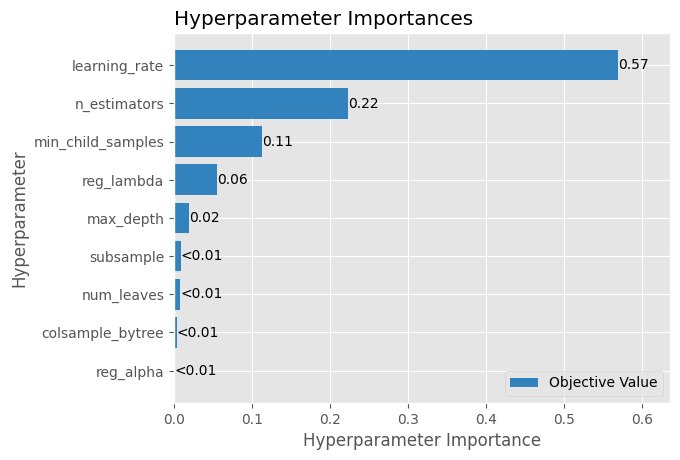

C:\Users\mukti\AppData\Local\Temp\ipykernel_13168\1838663870.py:77: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.plot_optimization_history(study)


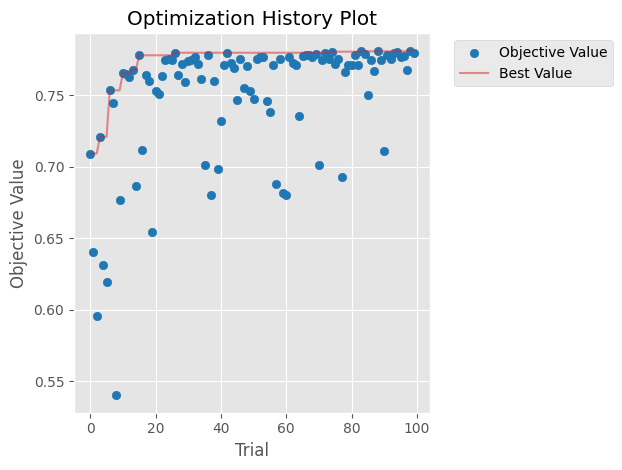

In [8]:
# Step 6: Optuna objective function for LightGBM

def objective_lightgbm(trial):
    # Hyperparameter space to explore
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-1, log=True)
    max_depth = trial.suggest_int('max_depth', 3, 15)
    num_leaves = trial.suggest_int('num_leaves', 20, 150)
    min_child_samples = trial.suggest_int('min_child_samples', 10, 100)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.5, 1.0)
    subsample = trial.suggest_float('subsample', 0.5, 1.0)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-4, 10.0, log=True)  # L1 regularization
    reg_lambda = trial.suggest_float('reg_lambda', 1e-4, 10.0, log=True)  # L2 regularization

    # Log trial parameters
    params = {
        'n_estimators': n_estimators,
        'learning_rate': learning_rate,
        'max_depth': max_depth,
        'num_leaves': num_leaves,
        'min_child_samples': min_child_samples,
        'colsample_bytree': colsample_bytree,
        'subsample': subsample,
        'reg_alpha': reg_alpha,
        'reg_lambda': reg_lambda
    }
    
    
    # validation split INSIDE Optuna
    X_tr, X_val, y_tr, y_val = train_test_split(
        X_train_vec, y_train, test_size=0.2, random_state=42, stratify=y_train
    )

     # convert both splits to float32
    X_tr  = X_tr.astype(np.float32)
    X_val = X_val.astype(np.float32)

    # Create LightGBM model
    model = LGBMClassifier(**params,
                           random_state=42,
                           objective="multiclass",   
                           num_class=3 
      )
    # Train on X_tr and evaluate on X_val
    model.fit(X_tr, y_tr)
    y_val_pred = model.predict(X_val)
    val_acc = accuracy_score(y_val, y_val_pred)

    # FIXED: Log each trial in MLflow without retraining full data
    log_mlflow_trial("LightGBM", params, val_acc, trial.number)

    return val_acc

# Step 7: Run Optuna for LightGBM, log the best model, and plot the importance of each parameter
def run_optuna_experiment(n_trials=100):
    study = optuna.create_study(direction="maximize")
    study.optimize(objective_lightgbm, n_trials=n_trials)  # Increased to 100 trials

    # Get the best parameters
    best_params = study.best_params

    best_model = LGBMClassifier(**best_params,
                                random_state=42,
                                objective="multiclass",
                                num_class=3)
    
    best_model.fit(X_train_vec, y_train)
    
    # Log the best model with MLflow, passing the algo_name as "lightgbm"
    log_mlflow_best("LightGBM", best_model, X_train_vec, X_test_vec, y_train, y_test,best_params)

    #plot parameter importance
    vis.plot_param_importances(study)
    plt.show()

    #plot optimization history
    vis.plot_optimization_history(study)
    plt.show()

# Run the experiment for LightGBM
run_optuna_experiment()



